Groundwater data: NEON (National Ecological Observatory Network). Elevation of groundwater (DP1.20100.001), RELEASE-2025. https://doi.org/10.48443/ndqs-6292. Dataset accessed from https://data.neonscience.org/data-products/DP1.20100.001/RELEASE-2025 on April 14, 2025.


In [1]:
import os
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from scipy.stats import linregress
# from sklearn.linear_model import LinearRegression
# from sklearn.metrics import mean_squared_error

import warnings

warnings.filterwarnings("ignore", category=FutureWarning, message=".*use_inf_as_na.*")


In [2]:
start_date = pd.to_datetime("2023-05-24 00:00:00")
end_date = pd.to_datetime("2023-11-20 00:00:00")

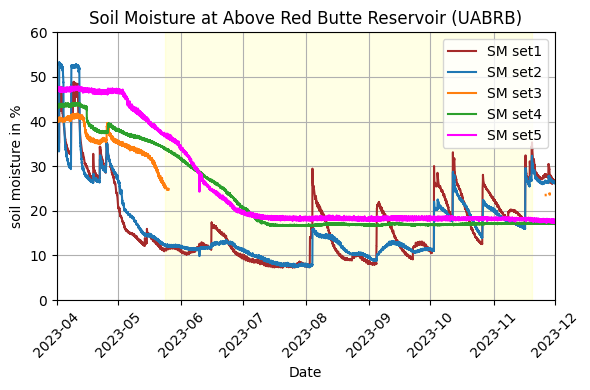

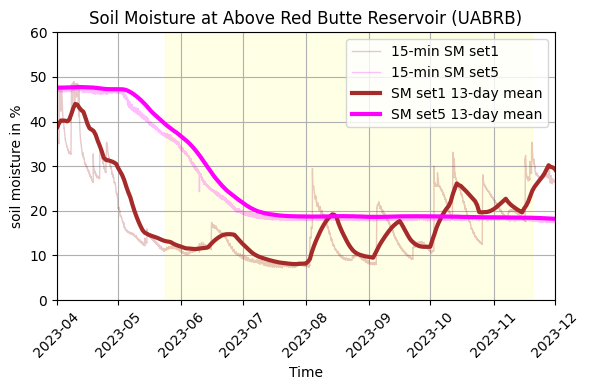

In [3]:

# Reading the discharge data from a CSV file (replace 'your_data_file.csv' with the actual file path)
SMdata = pd.read_csv('water_data/SM-UABRB.2023-12-31.csv',header=10, skiprows=[11])

# Convert the 'datetime' column to a datetime object for proper plotting
SMdata['datetime'] = pd.to_datetime(SMdata['Date_Time'], errors='coerce',)
SMdata_daily = SMdata.resample('D', on='datetime').max()

SMdata_smooth_set1 = SMdata_daily['soil_moisture_set_1'].rolling(window=13, center=False).mean()
SMdata_smooth_set5 = SMdata_daily['soil_moisture_set_5'].rolling(window=13, center=False).mean()

# Optionally, reset index if needed
SMdata_daily = SMdata_daily.reset_index()


# Plot the discharge data
plt.figure(figsize=(6, 4))
plt.axvspan(start_date, end_date, color='yellow', alpha=0.1,)

plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_1'] , label='SM set1', color='brown')
plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_2'] , label='SM set2')
plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_3'] , label='SM set3')
plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_4'] , label='SM set4')
plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_5'] , label='SM set5', color='magenta')
# plt.plot(SMdata_daily['datetime'],SMdata_daily['soil_moisture_set_1'] , label='SM set1 daily')

plt.xlabel('Date')
plt.ylabel('soil moisture in %')
plt.title('Soil Moisture at Above Red Butte Reservoir (UABRB)')
plt.xticks(rotation=45)
plt.xlim(pd.to_datetime('2023-04-01'), pd.to_datetime('2023-12-01'))
plt.ylim(0,60)

plt.grid(True)
plt.tight_layout()
plt.legend(loc='upper right')
plt.show()

plt.figure(figsize=(6, 4))
plt.axvspan(start_date, end_date, color='yellow', alpha=0.1, )
plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_1'] , label='15-min SM set1', color='brown', linewidth=1, alpha=0.25)
plt.plot(SMdata['datetime'],SMdata['soil_moisture_set_5'] , label='15-min SM set5',color='magenta', linewidth=1,alpha=0.25)
plt.plot(SMdata_daily['datetime'],SMdata_smooth_set1, label='SM set1 13-day mean', color='brown', linewidth=3)
plt.plot(SMdata_daily['datetime'],SMdata_smooth_set5, label='SM set5 13-day mean', color='magenta', linewidth=3)
plt.xlabel('Time')
plt.ylabel('soil moisture in %')
plt.title('Soil Moisture at Above Red Butte Reservoir (UABRB)')
plt.xticks(rotation=45)
plt.xlim(pd.to_datetime('2023-04-01'), pd.to_datetime('2023-12-01'))
plt.ylim(0,60)

plt.grid(True)
plt.tight_layout()
plt.legend(loc='upper right')
plt.show()

SMoutpd=pd.DataFrame()
SMoutpd['datetime'] = SMdata_daily['datetime']
SMoutpd['Daily_sm_set1'] = SMdata_daily['soil_moisture_set_1']
SMoutpd['Daily_sm_set5'] = SMdata_daily['soil_moisture_set_5']
SMoutpd['13D_sm_set1'] = SMdata_smooth_set1.reset_index(drop=True)
SMoutpd['13D_sm_set5'] = SMdata_smooth_set5.reset_index(drop=True)
SMoutpd.to_csv('water_data/Smooth_SM-UABRB.csv', index=False, float_format='%.4f')



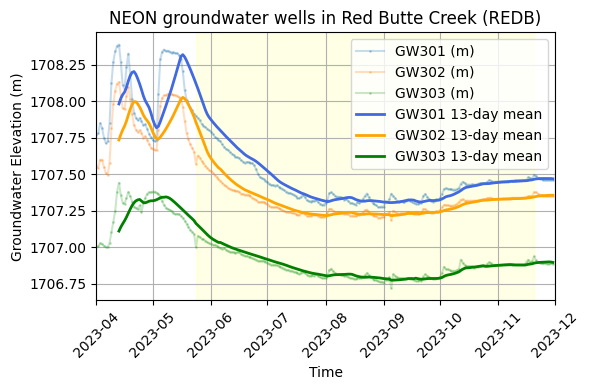

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

# Step 1: Read CSV
GWdata = pd.read_csv('NEONs_gw/NEON_groundwater_elevations_2023.csv')
# Step 2: datetime
GWdata['datetime'] = pd.to_datetime(GWdata['datetime']).dt.tz_localize(None)
# Step 3: Drop any remaining NaT rows just in case
GWdata = GWdata.dropna(subset=['datetime'])
GW301_smooth = GWdata['301_gw_elev'].rolling(window=13, center=False).mean()
GW302_smooth = GWdata['302_gw_elev'].rolling(window=13, center=False).mean()
GW303_smooth = GWdata['303_gw_elev'].rolling(window=13, center=False).mean()


# Step 7: Plot
plt.figure(figsize=(6, 4))
plt.title(f'NEON groundwater wells in Red Butte Creek (REDB)')
plt.axvspan(start_date, end_date, color='yellow', alpha=0.1,)

plt.plot( GWdata['datetime'],GWdata['301_gw_elev'], label='GW301 (m)', marker='.', markersize=2, linestyle='-', alpha=0.25)
plt.plot( GWdata['datetime'],GWdata['302_gw_elev'], label='GW302 (m)', marker='.', markersize=2, linestyle='-', alpha=0.25)
plt.plot( GWdata['datetime'],GWdata['303_gw_elev'], label='GW303 (m)', marker='.', markersize=2, linestyle='-', alpha=0.25)

plt.plot(GWdata['datetime'], GW301_smooth, label='GW301 13-day mean', linewidth=2, color='royalblue')
plt.plot(GWdata['datetime'], GW302_smooth, label='GW302 13-day mean', linewidth=2, color='orange')
plt.plot(GWdata['datetime'], GW303_smooth, label='GW303 13-day mean', linewidth=2, color='green')

plt.ylabel('Groundwater Elevation (m)')
plt.xticks(rotation=45)
# plt.xlim(pd.to_datetime('2023-05-24'), pd.to_datetime('2023-12-01'))
plt.xlim(pd.to_datetime('2023-04-01'), pd.to_datetime('2023-12-01'))
plt.xlabel('Time')

plt.grid(True)
plt.tight_layout()
plt.legend(loc='upper right')
plt.show()

GWoutpd=pd.DataFrame()
GWoutpd['datetime'] = GWdata['datetime']
GWoutpd['301_gw_elev'] = GWdata['301_gw_elev']
GWoutpd['302_gw_elev'] = GWdata['302_gw_elev']
GWoutpd['303_gw_elev'] = GWdata['303_gw_elev']
GWoutpd['13D_smooth_GW301_m'] = GW301_smooth
GWoutpd['13D_smooth_GW302_m'] = GW302_smooth
GWoutpd['13D_smooth_GW303_m'] = GW303_smooth
GWoutpd.to_csv('water_data/Smooth_NEON-GW.csv', index=False, float_format='%.4f')


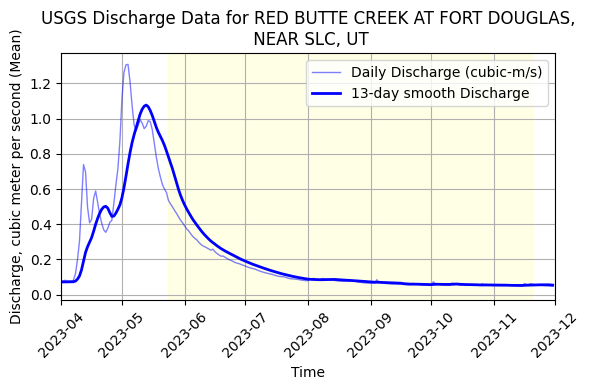

In [5]:

# Reading the discharge data from a CSV file (replace 'your_data_file.csv' with the actual file path)
data15min = pd.read_csv('water_data/USGS_10172200_discharge.tsv', delimiter='\t', header=24, skiprows=[25])
data15min = data15min.dropna(subset=['datetime'])

# Convert the 'datetime' column to a datetime object for proper plotting
data15min['datetime'] = pd.to_datetime(data15min['datetime'], errors='coerce')
data15min['Discharge_cubic-ft']=data15min['143725_00060_00003']
data15min['Discharge_cubic-m']=data15min['143725_00060_00003']*0.02831683199881

ds_day = data15min.resample('D', on='datetime').mean(numeric_only=True,)
ds_day = ds_day.reset_index()

# Resample to daily average
DSsmooth = ds_day['Discharge_cubic-m'].rolling(window=13, center=False, min_periods=1).mean()

# Plot the discharge data
plt.figure(figsize=(6, 4))
plt.axvspan(start_date, end_date, color='yellow', alpha=0.1, )

plt.plot(data15min['datetime'],data15min['Discharge_cubic-m'] , label='Daily Discharge (cubic-m/s)', color='blue', alpha=0.5, linewidth=1)  
plt.plot(ds_day['datetime'],DSsmooth , label='13-day smooth Discharge', color='blue', lw=2)
plt.xlabel('Time')
plt.ylabel('Discharge, cubic meter per second (Mean)')
plt.title(f'USGS Discharge Data for RED BUTTE CREEK AT FORT DOUGLAS,\n NEAR SLC, UT')
plt.xticks(rotation=45)
# plt.xlim(pd.to_datetime('2023-05-24'), pd.to_datetime('2023-12-01'))
plt.xlim(pd.to_datetime('2023-04-01'), pd.to_datetime('2023-12-01'))
# plt.ylim(0.,0.8)
plt.grid(True)
plt.tight_layout()
plt.legend()
plt.show()

DSpd=pd.DataFrame()
DSpd['datetime'] = ds_day['datetime']
DSpd['Daily_DS_cm'] = ds_day['Discharge_cubic-m']
DSpd['13D_smooth_DS_cm'] = DSsmooth.reset_index(drop=True)
DSpd.to_csv('water_data/Smooth_USGS-DS.csv', index=False, float_format='%.4f')



In [6]:

# # Reading the discharge data from a CSV file (replace 'your_data_file.csv' with the actual file path)
# data15min = pd.read_csv('water_data/USGS_10172200.csv', delimiter='\t', header=26, skiprows=[27])
# data15min = data15min.dropna(subset=['datetime'])

# # Convert the 'datetime' column to a datetime object for proper plotting
# data15min['datetime'] = pd.to_datetime(data15min['datetime'], errors='coerce')
# data15min['Discharge_ft']=data15min['144407_00065']
# data15min['Discharge_cm']=data15min['144407_00065']*30.48

# ds_day = data15min.resample('D', on='datetime').mean(numeric_only=True,)
# ds_day = ds_day.reset_index()

# # Resample to daily average
# DSsmooth = ds_day['Discharge_cm'].rolling(window=13, center=False, min_periods=1).mean()

# # Plot the discharge data
# plt.figure(figsize=(6, 4))
# plt.plot(data15min['datetime'],data15min['Discharge_cm'] , label='15-min Discharge (cm)', color='blue', alpha=0.5, linewidth=1)  
# plt.plot(ds_day['datetime'],DSsmooth , label='13-day smooth Discharge', color='red', )
# # plt.xlabel('Time')
# plt.ylabel('Discharge (Gage height, cm)')
# plt.title(f'USGS Discharge Data for RED BUTTE CREEK AT FORT DOUGLAS,\n NEAR SLC, UT')
# plt.xticks(rotation=45)
# plt.xlim(pd.to_datetime('2023-05-24'), pd.to_datetime('2023-12-01'))
# plt.grid(True)
# plt.tight_layout()
# plt.legend()
# plt.show()

# DSpd=pd.DataFrame()
# DSpd['datetime'] = ds_day['datetime']
# DSpd['Daily_DS_cm'] = ds_day['Discharge_cm']
# DSpd['13D_smooth_DS_cm'] = DSsmooth.reset_index(drop=True)
# DSpd.to_csv('water_data/Smooth_USGS-DS.csv', index=False, float_format='%.4f')



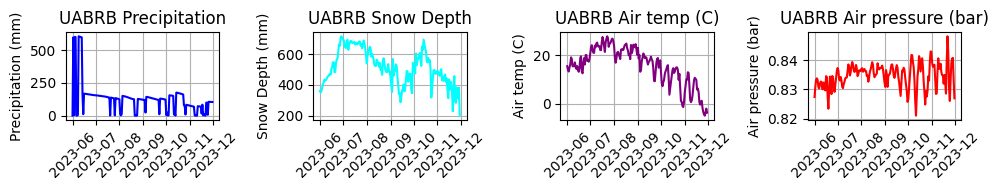

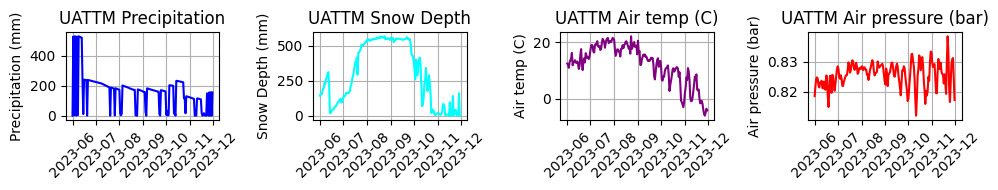

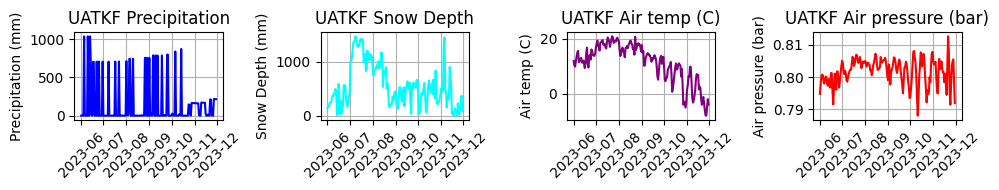

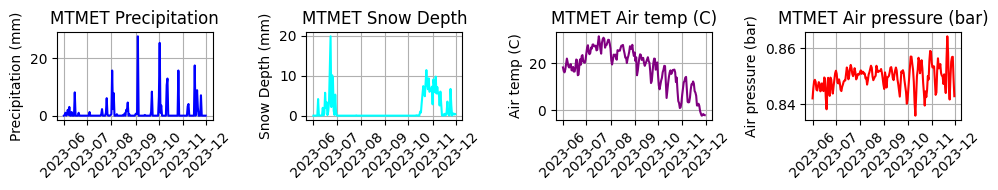

In [7]:
precip_path='mesowest_data/data/'
mesolist=["UABRB", "UATTM","UATKF","MTMET", ]

for kst, meso_st in enumerate(mesolist):
    meso_file=f'{precip_path}/{meso_st}_daily2.csv'
    meso=pd.read_csv(meso_file)
    meso['datetime']=pd.to_datetime(meso['Date_Time'])
    
    fig, ax = plt.subplots(1,4 , figsize=(10, 2))
    # fig, ax = plt.subplots(1,2 , figsize=(12, 2))
    ax[0].plot(meso['datetime'], meso['precip_daily'], label='Precipitation (mm)', color='blue')
    ax[0].set_title(str(meso_st) + ' Precipitation')
    ax[0].set_ylabel('Precipitation (mm)')
    ax[0].tick_params(axis='x', rotation=45)
    ax[0].grid(True)

    ax[1].plot(meso['datetime'], meso['snow_depth_set_1'], label='Snow Depth (mm)', color='cyan')
    ax[1].set_title(f'{mesolist[kst]} Snow Depth')
    ax[1].set_ylabel('Snow Depth (mm)')
    ax[1].tick_params(axis='x', rotation=45)
    ax[1].grid(True)

    ax[2].plot(meso['datetime'], meso['air_temp_set_1'], label='Air temp (C)', color='purple')
    ax[2].set_title(f'{mesolist[kst]} Air temp (C)')
    ax[2].set_ylabel('Air temp (C)')
    ax[2].tick_params(axis='x', rotation=45)
    ax[2].grid(True)

    ax[3].plot(meso['datetime'], meso['pressure_set_1']/100000, label='air pressure (bar)', color='red')
    ax[3].set_title(f'{mesolist[kst]} Air pressure (bar)')
    ax[3].set_ylabel('Air pressure (bar)')
    ax[3].tick_params(axis='x', rotation=45)
    ax[3].grid(True)    
    
    plt.tight_layout()

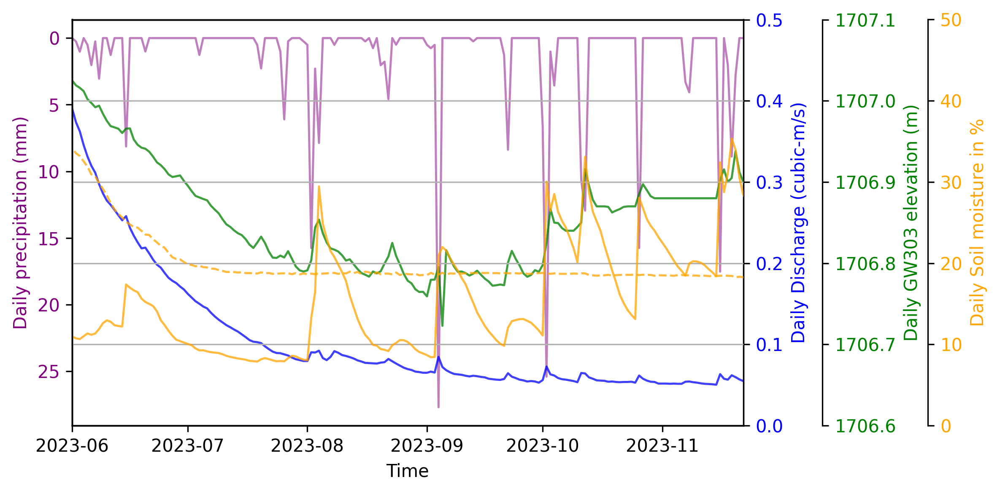

In [8]:
# Plot the discharge data
fig, ax = plt.subplots(1,1, figsize=(8, 4), dpi=300)
# plt.axvspan(start_date, end_date, color='yellow', alpha=0.1, )

ax.plot(meso['datetime'], meso['precip_daily'],
    label='Daily precipitation (mm)', 
    color='purple', 
    linestyle='-',
    linewidth=1.2,
    alpha=0.5
)

ax2 = ax.twinx()
ax2.set_ylim(0,0.5)
ax2.plot(
    DSpd['datetime'], 
    DSpd['Daily_DS_cm'], 
    label='Reversed Discharge (cm)', 
    color='blue', 
    linestyle='-',
    linewidth=1.2,    
    alpha=0.75
)
ax2.set_ylabel('Daily Discharge (cubic-m/s)', color='blue')
ax2.tick_params(axis='y', labelcolor='blue')
# ax2.spines['right'].set_position(('outward', 35))

ax4 = ax.twinx()
ax4.set_ylim(1706.6,1707.1)
ax4.plot(
    GWdata['datetime'], GWdata['303_gw_elev'], label='Daily GW303 elevation', 
    color='green', 
    linestyle='-',
    linewidth=1.2,
    alpha=0.75)
ax4.set_ylabel('Daily GW303 elevation (m)', color='green')
ax4.tick_params(axis='y', labelcolor='green')
ax4.spines['right'].set_position(('outward', 45))

ax5 = ax.twinx()
ax5.set_ylim(0,50)
ax5.plot(SMoutpd['datetime'],SMoutpd['Daily_sm_set5'],
    color='orange', 
    linestyle='--',
    linewidth=1.2,
    alpha=0.75)
ax5.plot(
    SMoutpd['datetime'],SMoutpd['Daily_sm_set1'],
    color='orange', 
    linestyle='-',
    linewidth=1.2,
    alpha=0.75)
ax5.set_ylabel('Daily Soil moisture in %', color='orange')
ax5.tick_params(axis='y', labelcolor='orange')
ax5.spines['right'].set_position(('outward', 105))   

        
ax.invert_yaxis()
ax.set_ylabel('Daily precipitation (mm)', color='purple')
ax.tick_params(axis='y', labelcolor='purple')
ax.set_xlabel('Time')

plt.xticks(rotation=45)
# plt.xlim(pd.to_datetime('2023-05-24'), pd.to_datetime('2023-12-01'))
plt.xlim(pd.to_datetime('2023-06-01'), pd.to_datetime('2023-11-22'))
# plt.ylim(0.,0.8)
plt.grid(True)
plt.tight_layout()
# plt.legend()
plt.show()


In [9]:
import glob
import numpy as np

seis_sta=pd.read_csv('redbutte_sta.csv')
seis_sta['stnm']=seis_sta['stnm'].astype(int).apply(lambda i: f"{i:03}")
seis_sta=seis_sta[:-1] 
print(seis_sta)



  stnm        lat         lon    elev
0  002  40.794796 -111.779490  1868.0
1  001  40.794836 -111.779309  1868.0
2  003  40.794740 -111.779110  1847.0
3  004  40.794670 -111.778810  1847.0
4  005  40.794660 -111.778630  1847.0
5  006  40.794660 -111.778400  1847.0


In [10]:
# 002 -> N051
# 001 -> N037
# 003 -> N018
# 004 -> S009
# 005 -> S024
# 006 -> S043

# Mapping dictionary
rename_map = {
    "002": "N051",
    "001": "N037",
    "003": "N018",
    "004": "S009",
    "005": "S024",
    "006": "S043"
}

# Example: renaming a list of station codes
stations = ["002", "001", "003", "004", "005", "006"]

renamed_stations = [rename_map[st] for st in stations]
print(renamed_stations)
# Output: ['N037', 'N051', 'N018', 'S009', 'S024', 'S043']
seis_sta['stnm_renamed']=renamed_stations
print(seis_sta)


['N051', 'N037', 'N018', 'S009', 'S024', 'S043']
  stnm        lat         lon    elev stnm_renamed
0  002  40.794796 -111.779490  1868.0         N051
1  001  40.794836 -111.779309  1868.0         N037
2  003  40.794740 -111.779110  1847.0         N018
3  004  40.794670 -111.778810  1847.0         S009
4  005  40.794660 -111.778630  1847.0         S024
5  006  40.794660 -111.778400  1847.0         S043


In [11]:

# output_path="Repro_fixori_prefilt_20Hz_withswap_sepa_4plot/concated/DVAVE_c2wei/ST/SC/"
output_path="Results_prefilt_20Hz_coefs//DVAVE_c2wei/ST/SC/"
# output_path="Results_prefilt_20Hz_coefs_codashort/DVAVE_c2wei/ST/SC/"
bandlist=['4-8','2-4',]

/tmp/ipykernel_3759116/2649469286.py:70: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98])


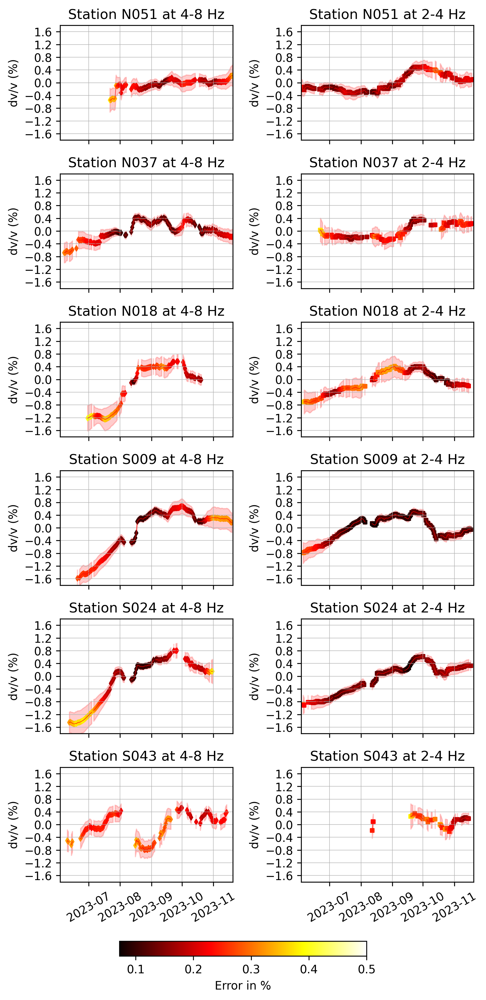

In [12]:
symb=["d","s","x","^","v"]

# Step 1: Get global min and max error
global_err_min = float('inf')
global_err_max = float('-inf')

coef='0.6'
for stnm in seis_sta['stnm']:
    for fband in bandlist:
        fn_pattern = f'{output_path}/dv_ave_*_coef{coef}_{stnm}_*_F{fband}*.out'
        fn = glob.glob(fn_pattern)
        if not fn:
            continue
        pd_dv = pd.read_csv(fn[0], sep='\s+', names=['dv', 'err', 'date', 'sta1', 'sta2', 'jday'])
        pd_dv['err'] *= 100
        global_err_min = min(global_err_min, pd_dv['err'].min())
        global_err_max = max(global_err_max, pd_dv['err'].max())

# Step 2: Plot as before, but use vmin and vmax in scatter()
fig, ax = plt.subplots(6, 2, figsize=(6, 12), dpi=300, sharex=True,)
# fig.suptitle(f'Longterm references + Weighted Average results:  codashort CodaCoef {coef} ave12-0_s', fontsize=12, y=0.98)

for nst, stnm in enumerate(seis_sta['stnm']):
    rename=seis_sta.loc[seis_sta['stnm'] == stnm, 'stnm_renamed'].values[0]
    for fk, fband in enumerate(bandlist):
        fn_pattern = f'{output_path}/dv_ave_*_coef{coef}_{stnm}_*_F{fband}*.out'
        fn = glob.glob(fn_pattern)
        if not fn:
            continue
        pd_dv = pd.read_csv(fn[0], sep='\s+', names=['dv', 'err', 'date', 'sta1', 'sta2', 'jday'])
        pd_dv['dv'] *= 100
        pd_dv['err'] *= 100
        pd_dv['date'] = pd.to_datetime(pd_dv['date'], format='%Y%m%d')

        # Filter out large errors
        errcut=0.4
        filtered_dv = pd_dv[pd_dv['err'] <= errcut]  # keep only err <= 0.8%

        group = filtered_dv['date'].diff().dt.days.gt(1).cumsum()


        for g in group.unique():
            chunk = filtered_dv[group == g]
            ax[nst, fk].plot(chunk['date'], chunk['dv'], color='red', lw=0.5, alpha=0.8)
            ax[nst, fk].fill_between(chunk['date'], chunk['dv'] - chunk['err'], chunk['dv'] + chunk['err'], color='red', alpha=0.2)

        # Fixed vmin and vmax
        scatter = ax[nst, fk].scatter(
            filtered_dv['date'], filtered_dv['dv'], 
            c=filtered_dv['err'], cmap='hot', 
            vmin=global_err_min, vmax=0.5,
            s=10, marker=symb[fk], label=f'{fband} Hz'
        )

        ax[nst, fk].set_ylim( -1.8, 1.8)
        ax[nst, fk].set_xlim(pd.to_datetime("2023-06-03"), pd.to_datetime("2023-11-20"))
        ax[nst, fk].set_ylabel('dv/v (%)')
        ax[nst, fk].set_title(f'Station {rename} at {fband} Hz')
        ax[nst, fk].grid(True, linewidth=0.5, alpha=0.8)
        ax[nst, fk].tick_params(axis='x', rotation=30)
        ax[nst, fk].set_yticks(np.arange(-1.6, 1.6+0.01, 0.4))


# Optional: Shared colorbar for the whole figure
cbar_ax = fig.add_axes([0.25, 0.01, 0.5, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(scatter, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Error in %')
cbar.ax.tick_params(labelsize=10)

plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.savefig(f'DV_CodaCoef{coef}_unploterr.png',dpi=300)
plt.show()


/tmp/ipykernel_3759116/560856547.py:130: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98])


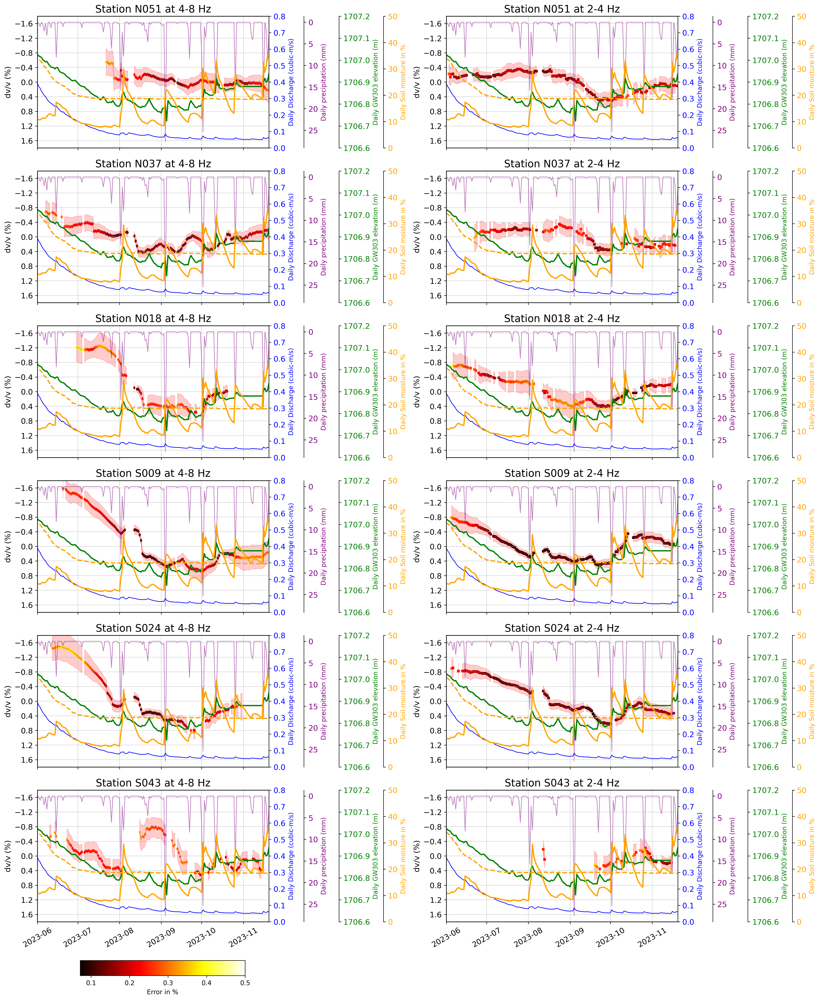

In [13]:
import numpy as np

# Step 1: Get global min and max error
global_err_min = float('inf')
global_err_max = float('-inf')


coef='0.6'
for stnm in seis_sta['stnm']:
    for fband in bandlist:
        fn_pattern = f'{output_path}/dv_ave_*_coef{coef}_{stnm}_*_F{fband}*.out'
        fn = glob.glob(fn_pattern)
        if not fn:
            continue
        pd_dv = pd.read_csv(fn[0], sep='\s+', names=['dv', 'err', 'date', 'sta1', 'sta2', 'jday'])
        pd_dv['err'] *= 100
        global_err_min = min(global_err_min, pd_dv['err'].min())
        global_err_max = max(global_err_max, pd_dv['err'].max())

# Step 2: Plot as before, but use vmin and vmax in scatter()
fig, ax = plt.subplots(6, 2, figsize=(18, 22), dpi=300, sharex=True,)
# fig.suptitle('Longterm references + Weighted Average results: COR_sn5_20Hz prefilt ave12-0_s', fontsize=12, y=1.0001)

for nst, stnm in enumerate(seis_sta['stnm']):
    rename=seis_sta.loc[seis_sta['stnm'] == stnm, 'stnm_renamed'].values[0]
    for fk, fband in enumerate(bandlist):
        fn_pattern = f'{output_path}/dv_ave_*_coef{coef}_{stnm}_*_F{fband}*.out'
        fn = glob.glob(fn_pattern)
        if not fn:
            continue
        pd_dv = pd.read_csv(fn[0], sep='\s+', names=['dv', 'err', 'date', 'sta1', 'sta2', 'jday'])
        pd_dv['dv'] *= 100
        pd_dv['err'] *= 100
        pd_dv['date'] = pd.to_datetime(pd_dv['date'], format='%Y%m%d')

        group = pd_dv['date'].diff().dt.days.gt(1).cumsum()

        # Filter out large errors
        errcut=0.4
        filtered_dv = pd_dv[pd_dv['err'] <= errcut]  # keep only err <= 0.8%

        group = filtered_dv['date'].diff().dt.days.gt(1).cumsum()
        for g in group.unique():
            chunk = filtered_dv[group == g]
            ax[nst, fk].plot(chunk['date'], chunk['dv'], color='red', lw=0.5, alpha=0.8)
            ax[nst, fk].fill_between(chunk['date'], chunk['dv'] - chunk['err'], chunk['dv'] + chunk['err'], color='red', alpha=0.2)

        # Fixed vmin and vmax
        scatter = ax[nst, fk].scatter(
            filtered_dv['date'], filtered_dv['dv'], 
            c=filtered_dv['err'], cmap='hot', 
            vmin=global_err_min, vmax=0.5,
            s=10, marker=symb[fk], label=f'{fband} Hz'
        )

        ax[nst, fk].set_ylim(1.8, -1.8)
        ax[nst, fk].set_xlim(pd.to_datetime("2023-06-01"), pd.to_datetime("2023-11-20"))
        ax[nst, fk].set_ylabel('dv/v (%)', fontsize=12)
        ax[nst, fk].set_title(f'Station {rename} at {fband} Hz', fontsize=16)
        ax[nst, fk].grid(True, linewidth=0.5, alpha=0.8)
        ax[nst, fk].tick_params(axis='x', rotation=30, labelsize=12)
        ax[nst, fk].tick_params(axis='y', labelsize=12)
        ax[nst, fk].set_yticks(np.arange(-1.6, 1.6+0.01, 0.4))


        ax2 = ax[nst, fk].twinx()
        ax2.plot(
            DSpd['datetime'], 
            DSpd['Daily_DS_cm'], 
            label='Reversed Discharge (cm)', 
            color='blue', 
            linestyle='-',
            linewidth=1
        )
        ax2.set_ylabel('Daily Discharge (cubic-m/s)', color='blue')
        ax2.tick_params(axis='y', labelcolor='blue',labelsize=12)
        ax2.set_ylim(0, 0.8)
        
        ax3 = ax[nst, fk].twinx()
        ax3.plot(meso['datetime'], meso['precip_daily'],
            label='Daily precipitation (mm)', 
            color='purple', 
            linestyle='-',
            linewidth=1,
            alpha=0.5
        )
        ax3.set_ylabel('Daily precipitation (mm)', color='purple')
        ax3.invert_yaxis()
        ax3.tick_params(axis='y', labelcolor='purple',labelsize=12)
        ax3.spines['right'].set_position(('outward', 55))
        
        ax4 = ax[nst, fk].twinx()
        # ax4.set_ylim(1707.2,1707.8)
        ax4.set_ylim(1706.6,1707.2)
        ax4.plot(
            GWdata['datetime'], GWdata['303_gw_elev'], label='Daily GW303 elevation (m)', 
            color='green', 
            linestyle='-',
            linewidth=2,
        )
        ax4.set_ylabel('Daily GW303 elevation (m)', color='green')
        ax4.tick_params(axis='y', labelcolor='green',labelsize=12)
        ax4.spines['right'].set_position(('outward', 110))

        ax5 = ax[nst, fk].twinx()
        ax5.set_ylim(0,50)
        ax5.plot(SMoutpd['datetime'],SMoutpd['Daily_sm_set5'],
            color='orange', 
            linestyle='--',
            linewidth=2,
        )
        ax5.plot(
            SMoutpd['datetime'],SMoutpd['Daily_sm_set1'],
            color='orange', 
            linestyle='-',
            linewidth=2,
        )
        ax5.set_ylabel('Daily Soil moisture in %', color='orange')
        ax5.tick_params(axis='y', labelcolor='orange',labelsize=12)
        ax5.spines['right'].set_position(('outward', 180))       



# Optional: Shared colorbar for the whole figure
cbar_ax = fig.add_axes([0.1, 0.01, 0.2, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(scatter, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Error in %')
cbar.ax.tick_params(labelsize=10)

plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()


/tmp/ipykernel_3759116/314035905.py:124: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.98])


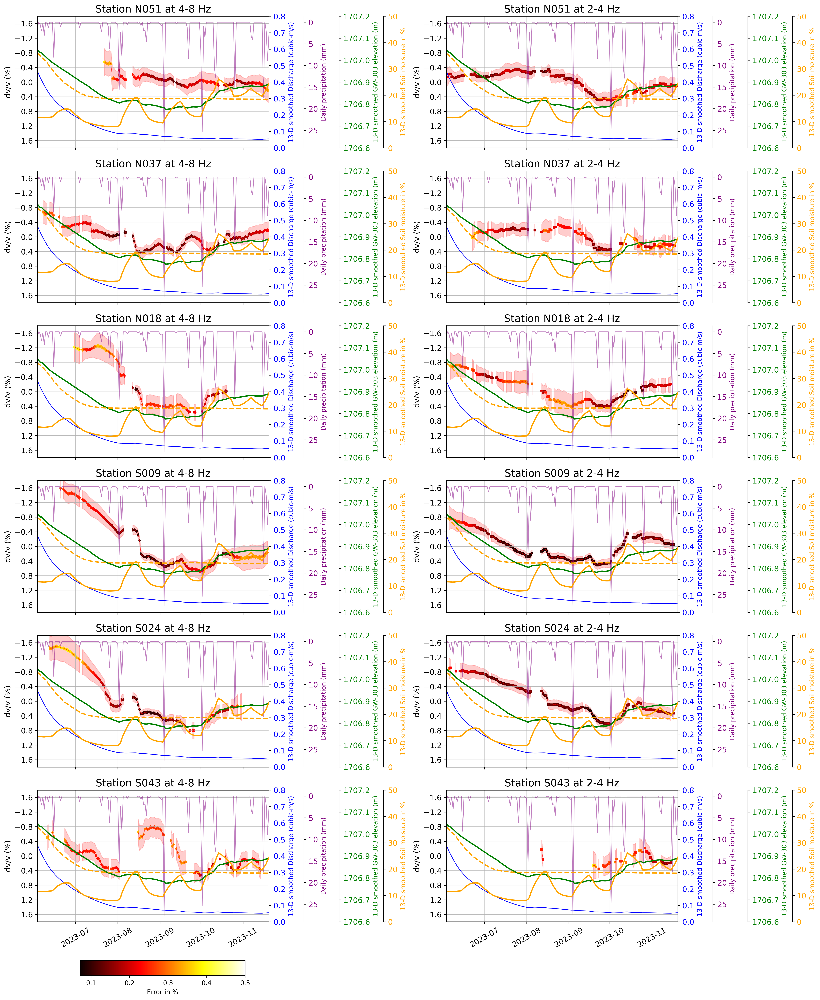

In [14]:
import numpy as np

# Step 1: Get global min and max error
global_err_min = float('inf')
global_err_max = float('-inf')

for stnm in seis_sta['stnm']:
    for fband in bandlist:
        fn_pattern = f'{output_path}/dv_ave_*_coef{coef}_{stnm}_*_F{fband}*.out'
        fn = glob.glob(fn_pattern)
        if not fn:
            continue
        pd_dv = pd.read_csv(fn[0], sep='\s+', names=['dv', 'err', 'date', 'sta1', 'sta2', 'jday'])
        pd_dv['err'] *= 100
        global_err_min = min(global_err_min, pd_dv['err'].min())
        global_err_max = max(global_err_max, pd_dv['err'].max())

# Step 2: Plot as before, but use vmin and vmax in scatter()
fig, ax = plt.subplots(6, 2, figsize=(18, 22), dpi=300, sharex=True,)
# fig.suptitle('Longterm references + Weighted Average results: COR_sn5_20Hz prefilt ave12-0_s', fontsize=12, y=1.0001)

for nst, stnm in enumerate(seis_sta['stnm']):
    rename=seis_sta.loc[seis_sta['stnm'] == stnm, 'stnm_renamed'].values[0]
    for fk, fband in enumerate(bandlist):
        fn_pattern = f'{output_path}/dv_ave_*_coef{coef}_{stnm}_*_F{fband}*.out'
        fn = glob.glob(fn_pattern)
        if not fn:
            continue
        pd_dv = pd.read_csv(fn[0], sep='\s+', names=['dv', 'err', 'date', 'sta1', 'sta2', 'jday'])
        pd_dv['dv'] *= 100
        pd_dv['err'] *= 100
        pd_dv['date'] = pd.to_datetime(pd_dv['date'], format='%Y%m%d')

        # Filter out large errors
        errcut=0.4
        filtered_dv = pd_dv[pd_dv['err'] <= errcut]  # keep only err <= 0.8%

        group = filtered_dv['date'].diff().dt.days.gt(1).cumsum()
        for g in group.unique():
            chunk = filtered_dv[group == g]
            ax[nst, fk].plot(chunk['date'], chunk['dv'], color='red', lw=0.5, alpha=0.8)
            ax[nst, fk].fill_between(chunk['date'], chunk['dv'] - chunk['err'], chunk['dv'] + chunk['err'], color='red', alpha=0.2)

        # Fixed vmin and vmax
        scatter = ax[nst, fk].scatter(
            filtered_dv['date'], filtered_dv['dv'], 
            c=filtered_dv['err'], cmap='hot', 
            vmin=global_err_min, vmax=0.5,
            s=10, marker=symb[fk], label=f'{fband} Hz'
        )

        ax[nst, fk].set_ylim(1.8, -1.8)
        ax[nst, fk].set_xlim(pd.to_datetime("2023-06-03"), pd.to_datetime("2023-11-20"))
        ax[nst, fk].set_ylabel('dv/v (%)', fontsize=12)
        ax[nst, fk].set_title(f'Station {rename} at {fband} Hz', fontsize=16)
        ax[nst, fk].grid(True, linewidth=0.5, alpha=0.8)
        ax[nst, fk].tick_params(axis='x', rotation=30, labelsize=12)
        ax[nst, fk].tick_params(axis='y', labelsize=12)
        ax[nst, fk].set_yticks(np.arange(-1.6, 1.6+0.01, 0.4), )


        ax2 = ax[nst, fk].twinx()
        ax2.plot(
            DSpd['datetime'], 
            DSpd['13D_smooth_DS_cm'], 
            label='Reversed Discharge (cm)', 
            color='blue', 
            linestyle='-',
            linewidth=1
        )
        ax2.set_ylabel('13-D smoothed Discharge (cubic-m/s)', color='blue')
        ax2.tick_params(axis='y', labelcolor='blue', labelsize=12)
        ax2.set_ylim(0, 0.8)
        
        ax3 = ax[nst, fk].twinx()
        ax3.plot(meso['datetime'], meso['precip_daily'],
            label='Daily precipitation (mm)', 
            color='purple', 
            linestyle='-',
            linewidth=1,
            alpha=0.5
        )
        ax3.set_ylabel('Daily precipitation (mm)', color='purple')
        ax3.invert_yaxis()
        ax3.tick_params(axis='y', labelcolor='purple', labelsize=12)
        ax3.spines['right'].set_position(('outward', 55))
        
        ax4 = ax[nst, fk].twinx()
        # ax4.set_ylim(1707.2,1707.8)
        ax4.set_ylim(1706.6,1707.2)
        ax4.plot(
            GWoutpd['datetime'], GWoutpd['13D_smooth_GW303_m'], label='13-D GW303 elevation (m)', 
            color='green', 
            linestyle='-',
            linewidth=2,
        )
        ax4.set_ylabel('13-D smoothed GW-303 elevation (m)', color='green')
        ax4.tick_params(axis='y', labelcolor='green', labelsize=12)
        ax4.spines['right'].set_position(('outward', 110))

        ax5 = ax[nst, fk].twinx()
        ax5.set_ylim(0,50)
        ax5.plot(SMoutpd['datetime'],SMoutpd['13D_sm_set5'],
            color='orange', 
            linestyle='--',
            linewidth=2,
        )
        ax5.plot(
            SMoutpd['datetime'],SMoutpd['13D_sm_set1'],
            color='orange', 
            linestyle='-',
            linewidth=2,
        )
        ax5.set_ylabel('13-D smoothed Soil moisture in %', color='orange')
        ax5.tick_params(axis='y', labelcolor='orange', labelsize=12)
        ax5.spines['right'].set_position(('outward', 180))    

# Optional: Shared colorbar for the whole figure
cbar_ax = fig.add_axes([0.1, 0.01, 0.2, 0.015])  # [left, bottom, width, height]
cbar = fig.colorbar(scatter, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Error in %')
cbar.ax.tick_params(labelsize=10)

plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()


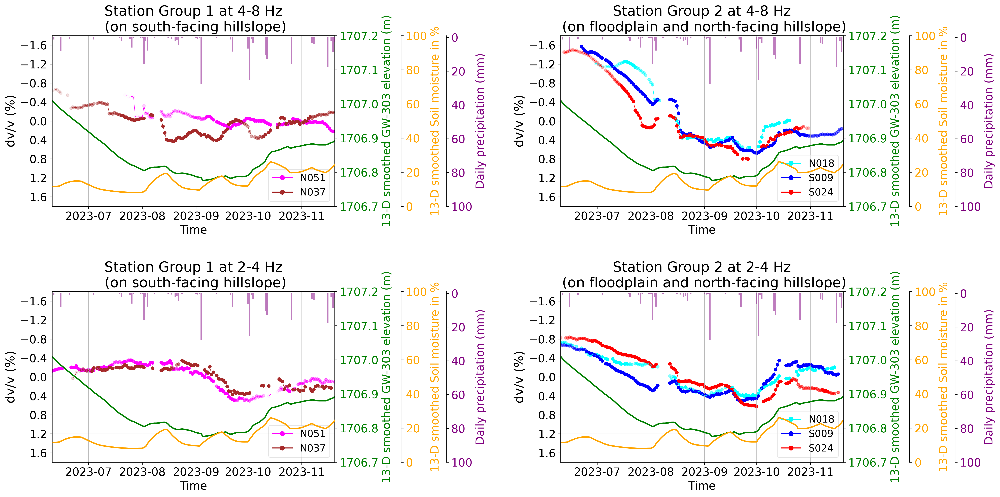

In [47]:
from matplotlib.lines import Line2D

color_set=['magenta', 'brown', 'cyan','blue','red','lightyellow', 'red',   'black']
# Example: station_groups defines which stations to combine
station_groups = {
    "Stations 1+2": ["002","001",],
    "Stations 4–5": [ "003","004", "005",]
}
bands = ["4-8","2-4", ]
seis_sta['stnm_renamed']

fig, axes = plt.subplots(2, 2, figsize=(20, 10), dpi=300, )
# axes is 2x2 array
for row, band in enumerate(bands):
    for col, (group_name, group_stations) in enumerate(station_groups.items()):
        ax = axes[row, col]

        for stnm in group_stations:
            rename=seis_sta.loc[seis_sta['stnm'] == stnm, 'stnm_renamed'].values[0]
            stno=seis_sta.loc[seis_sta['stnm'] == stnm].index[0]
            fn_pattern = f'{output_path}/dv_ave_*_coef{coef}_{stnm}_*_F{band}*.out'
            fn = glob.glob(fn_pattern)
            if not fn:
                continue
            pd_dv = pd.read_csv(fn[0], sep='\s+', names=['dv', 'err', 'date', 'sta1', 'sta2', 'jday'])
            pd_dv['dv'] *= 100
            pd_dv['err'] *= 100
            pd_dv['date'] = pd.to_datetime(pd_dv['date'], format='%Y%m%d')
            alpha_norm = (pd_dv['err'] - pd_dv['err'].min()) / (pd_dv['err'].max() - pd_dv['err'].min())
            alpha_norm = (1 - alpha_norm)
            alpha_norm = np.where(alpha_norm > 0.6, 1, alpha_norm)

            errcut=0.4
            filtered_dv = pd_dv[pd_dv['err'] <= errcut]  # keep only err <= 0.8%

            group = filtered_dv['date'].diff().dt.days.gt(1).cumsum()

            for g in group.unique():
                chunk = filtered_dv[group == g]
                ax.plot(chunk['date'], chunk['dv'], color=color_set[stno], lw=0.5,)
                # ax.fill_between(chunk['date'], chunk['dv'] - chunk['err'], chunk['dv'] + chunk['err'], color='grey', alpha=0.15)

            # Fixed vmin and vmax
            scatter = ax.scatter(
                filtered_dv['date'], filtered_dv['dv'], color=color_set[stno], alpha=alpha_norm,
                s=16, marker='o', label=f'{rename} at {band} Hz')

       
        ax.set_ylim(1.8, -1.8)
        ax.set_xlim(pd.to_datetime("2023-06-10"), pd.to_datetime("2023-11-20"))
        ax.set_ylabel('dv/v (%)', fontsize=18)
        ax.grid(True, linewidth=0.5, alpha=0.8)
        ax.tick_params(axis='x', rotation=0, labelsize=16)
        ax.tick_params(axis='y', labelsize=16)
        ax.set_yticks(np.arange(-1.6, 1.6+0.01, 0.4), )
        
        
        ax4 = ax.twinx()
        # ax4.set_ylim(1707.2,1707.8)
        ax4.set_ylim(1706.7,1707.2)
        ax4.plot(
            GWoutpd['datetime'], GWoutpd['13D_smooth_GW303_m'], label='13-D GW303 elevation (m)', 
            color='green', 
            linestyle='-',
            linewidth=2,
        )
        ax4.set_ylabel('13-D smoothed GW-303 elevation (m)', color='green', fontsize=16)
        ax4.tick_params(axis='y', labelcolor='green', labelsize=16)
        ax4.spines['right'].set_position(('outward', 0))
        
                
        ax3 = ax.twinx()
        ax3.bar(meso['datetime'], meso['precip_daily'],
            label='Daily precipitation (mm)', 
            color='purple', 
            linestyle='-',
            linewidth=1,
            alpha=0.5
        )
        ax3.set_ylabel('Daily precipitation (mm)', color='purple', fontsize=16)
        ax3.invert_yaxis()
        ax3.tick_params(axis='y', labelcolor='purple', labelsize=16)
        ax3.spines['right'].set_position(('outward', 160))
        ax3.set_ylim(100, -1)
        

        ax5 = ax.twinx()
        ax5.set_ylim(0,100)
        ax5.plot(
            SMoutpd['datetime'],SMoutpd['13D_sm_set1'],
            color='orange', 
            linestyle='-',
            linewidth=2,
        )
        ax5.set_ylabel('13-D smoothed Soil moisture in %', color='orange', fontsize=16)
        ax5.tick_params(axis='y', labelcolor='orange', labelsize=16)
        ax5.spines['right'].set_position(('outward', 95))   
        
            
        if  col == 0: 
            if row ==0: 
                ax.set_title(f'Station Group 1 at {band} Hz\n (on south-facing hillslope)', fontsize=20)
            else: 
                ax.set_title(f'Station Group 1 at {band} Hz\n (on south-facing hillslope)', fontsize=20)
            ax.set_xlabel('Time', fontsize=16)
            legend_handles = [
                Line2D([0], [0], marker='o', color=color_set[0], label=f"{seis_sta['stnm_renamed'][0]}", markerfacecolor=color_set[0], markersize=6),
                Line2D([0], [0], marker='o', color=color_set[1], label=f"{seis_sta['stnm_renamed'][1]}", markerfacecolor=color_set[1], markersize=6),
            ]
        else:
            if row ==0: 
                ax.set_title(f'Station Group 2 at {band} Hz\n (on floodplain and north-facing hillslope)', fontsize=20)
            else: 
                ax.set_title(f'Station Group 2 at {band} Hz\n (on floodplain and north-facing hillslope)', fontsize=20)
            ax.set_xlabel('Time', fontsize=16)
            legend_handles = [
                Line2D([0], [0], marker='o', color=color_set[2], label=f"{seis_sta['stnm_renamed'][2]}", markerfacecolor=color_set[2], markersize=6),
                Line2D([0], [0], marker='o', color=color_set[3], label=f"{seis_sta['stnm_renamed'][3]}", markerfacecolor=color_set[3], markersize=6),
                Line2D([0], [0], marker='o', color=color_set[4], label=f"{seis_sta['stnm_renamed'][4]}", markerfacecolor=color_set[4], markersize=6),
            ]
        # ax.legend(handles=legend_handles, fontsize=14, bbox_to_anchor=(0.25, 0.2),  loc='lower right', framealpha=0.5 )
        ax.legend(handles=legend_handles, fontsize=14, loc='lower right', framealpha=0.5 )


plt.tight_layout()
plt.subplots_adjust(wspace=0.8, hspace=0.5)
plt.show()


In [ ]:
station_dfs = {}  # key = renamed station, value = dataframe
band = '2-4'

for stnm in seis_sta['stnm'][:-1]:
    rename = seis_sta.loc[seis_sta['stnm'] == stnm, 'stnm_renamed'].values[0]
    fn_pattern = f'{output_path}/dv_ave_*_coef{coef}_{stnm}_*_F{band}*.out'
    fn = glob.glob(fn_pattern)
    if not fn:
        continue

    pd_dv = pd.read_csv(fn[0], sep='\s+', names=['dv', 'err', 'date', 'sta1', 'sta2', 'jday'])
    pd_dv['date'] = pd.to_datetime(pd_dv['date'].astype(str), format='%Y%m%d', errors='coerce')


    errcut = 0.4
    filtered_dv = pd_dv[pd_dv['err'] <= errcut]  # keep only err <= 0.4
    filtered_dv = filtered_dv[['date', 'dv']].rename(columns={'dv': rename})
    
    # store by station name
    station_dfs[rename] = filtered_dv

from functools import reduce

# merge all station dataframes by date
df_all = reduce(lambda left, right: pd.merge(left, right, on='date', how='outer'), station_dfs.values())

# ---- Add Soil Moisture (SM) and Groundwater (GW) ----
# ensure datetime columns are in datetime format
SMoutpd['datetime'] = pd.to_datetime(SMoutpd['datetime'])
GWoutpd['datetime'] = pd.to_datetime(GWoutpd['datetime'])
# Ensure consistent datetime type (remove timezone if present)
SMoutpd['datetime'] = pd.to_datetime(SMoutpd['datetime']).dt.tz_localize(None)
GWoutpd['datetime'] = pd.to_datetime(GWoutpd['datetime']).dt.tz_localize(None)
df_all['date'] = pd.to_datetime(df_all['date']).dt.tz_localize(None)

print(df_all['date'].min(), df_all['date'].max())
print(SMoutpd['datetime'].min(), SMoutpd['datetime'].max())
print(GWoutpd['datetime'].min(), GWoutpd['datetime'].max())

# merge with df_all by date
df_all = pd.merge_asof(
    df_all.sort_values('date'),
    SMoutpd[['datetime', '13D_sm_set1']].rename(columns={'datetime': 'date', '13D_sm_set1': 'SoilMoisture'}),
    on='date',
    direction='nearest',  # pick nearest timestamp if not exact
    tolerance=pd.Timedelta('1D')  # allow up to 1 day mismatch
)

df_all = pd.merge_asof(
    df_all.sort_values('date'),
    GWoutpd[['datetime', '13D_smooth_GW303_m']].rename(columns={'datetime': 'date', '13D_smooth_GW303_m': 'Groundwater'}),
    on='date',
    direction='nearest',
    tolerance=pd.Timedelta('1D')
)

# optional: sort by date
df_all = df_all.sort_values('date').reset_index(drop=True)

# ---- Compute correlation matrix ----
corr_matrix = df_all.drop(columns='date').corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)


from matplotlib.colors import LinearSegmentedColormap
colors = ['navy','blue', 'lightblue',  'lightcyan',  'white', 'white',  'white',  'lightyellow', 'pink', 'red','darkred']
polar_cmap = LinearSegmentedColormap.from_list('polar', colors, N=256)



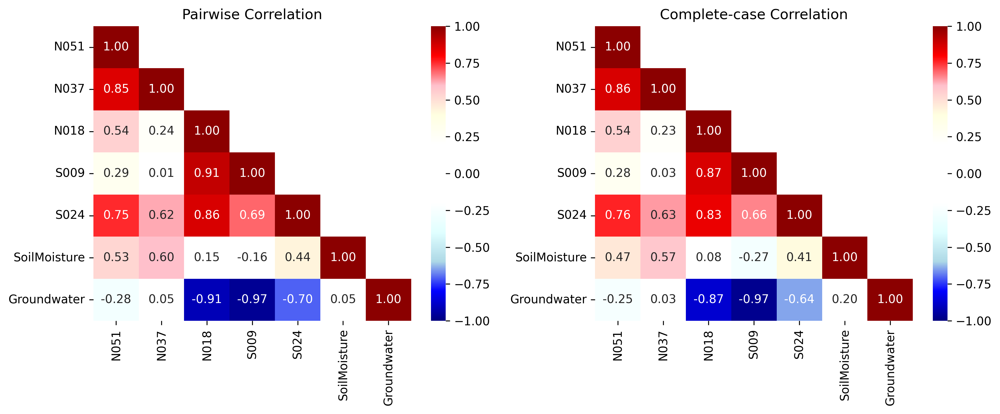

In [18]:
# ---- Pairwise correlation (default) ----
corr_pairwise = df_all.drop(columns='date').corr()

# ---- Complete-case correlation (only rows where all columns have values) ----
corr_complete = df_all.dropna().drop(columns='date').corr()

# ---- Plot side by side ----
fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=300)

mask = np.triu(np.ones_like(corr_pairwise, dtype=bool), k=1)

sns.heatmap(corr_pairwise, annot=True, mask=mask, fmt=".2f",
            cmap=polar_cmap, vmin=-1, vmax=1, ax=axes[0])
axes[0].set_title('Pairwise Correlation')

mask2 = np.triu(np.ones_like(corr_complete, dtype=bool), k=1)
sns.heatmap(corr_complete, annot=True, mask=mask2, fmt=".2f",
            cmap=polar_cmap, vmin=-1, vmax=1, ax=axes[1])
axes[1].set_title('Complete-case Correlation')

plt.tight_layout()
plt.show()


In [ ]:
station_dfs = {}  # key = renamed station, value = dataframe
band = '4-8'

for stnm in seis_sta['stnm'][:-1]:
    rename = seis_sta.loc[seis_sta['stnm'] == stnm, 'stnm_renamed'].values[0]
    fn_pattern = f'{output_path}/dv_ave_*_coef{coef}_{stnm}_*_F{band}*.out'
    fn = glob.glob(fn_pattern)
    if not fn:
        continue

    pd_dv = pd.read_csv(fn[0], sep='\s+', names=['dv', 'err', 'date', 'sta1', 'sta2', 'jday'])
    pd_dv['date'] = pd.to_datetime(pd_dv['date'].astype(str), format='%Y%m%d', errors='coerce')


    errcut = 0.4
    filtered_dv = pd_dv[pd_dv['err'] <= errcut]  # keep only err <= 0.4
    filtered_dv = filtered_dv[['date', 'dv']].rename(columns={'dv': rename})
    
    # store by station name
    station_dfs[rename] = filtered_dv

from functools import reduce

# merge all station dataframes by date
df_all = reduce(lambda left, right: pd.merge(left, right, on='date', how='outer'), station_dfs.values())

# ---- Add Soil Moisture (SM) and Groundwater (GW) ----
# ensure datetime columns are in datetime format
SMoutpd['datetime'] = pd.to_datetime(SMoutpd['datetime'])
GWoutpd['datetime'] = pd.to_datetime(GWoutpd['datetime'])
# Ensure consistent datetime type (remove timezone if present)
SMoutpd['datetime'] = pd.to_datetime(SMoutpd['datetime']).dt.tz_localize(None)
GWoutpd['datetime'] = pd.to_datetime(GWoutpd['datetime']).dt.tz_localize(None)
df_all['date'] = pd.to_datetime(df_all['date']).dt.tz_localize(None)

print(df_all['date'].min(), df_all['date'].max())
print(SMoutpd['datetime'].min(), SMoutpd['datetime'].max())
print(GWoutpd['datetime'].min(), GWoutpd['datetime'].max())

# merge with df_all by date
df_all = pd.merge_asof(
    df_all.sort_values('date'),
    SMoutpd[['datetime', '13D_sm_set1']].rename(columns={'datetime': 'date', '13D_sm_set1': 'SoilMoisture'}),
    on='date',
    direction='nearest',  # pick nearest timestamp if not exact
    tolerance=pd.Timedelta('1D')  # allow up to 1 day mismatch
)

df_all = pd.merge_asof(
    df_all.sort_values('date'),
    GWoutpd[['datetime', '13D_smooth_GW303_m']].rename(columns={'datetime': 'date', '13D_smooth_GW303_m': 'Groundwater'}),
    on='date',
    direction='nearest',
    tolerance=pd.Timedelta('1D')
)

# optional: sort by date
df_all = df_all.sort_values('date').reset_index(drop=True)

# ---- Compute correlation matrix ----
corr_matrix = df_all.drop(columns='date').corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)



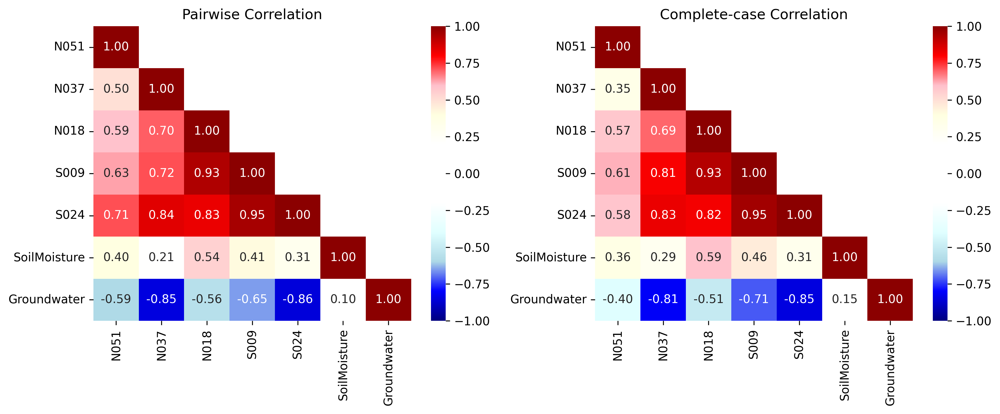

In [20]:
# ---- Pairwise correlation (default) ----
corr_pairwise = df_all.drop(columns='date').corr()

# ---- Complete-case correlation (only rows where all columns have values) ----
corr_complete = df_all.dropna().drop(columns='date').corr()

# ---- Plot side by side ----
fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=300)

mask = np.triu(np.ones_like(corr_pairwise, dtype=bool), k=1)

sns.heatmap(corr_pairwise, annot=True, mask=mask, fmt=".2f",
            cmap=polar_cmap, vmin=-1, vmax=1, ax=axes[0])
axes[0].set_title('Pairwise Correlation')

mask2 = np.triu(np.ones_like(corr_complete, dtype=bool), k=1)
sns.heatmap(corr_complete, annot=True, mask=mask2, fmt=".2f",
            cmap=polar_cmap, vmin=-1, vmax=1, ax=axes[1])
axes[1].set_title('Complete-case Correlation')

plt.tight_layout()
plt.show()


In [22]:
df_all

,date,N051,N037,N018,S009,S024,SoilMoisture,Groundwater
0,2023-06-03,NaN,NaN,NaN,-0.014417,NaN,11.626923,1707.048354
1,2023-06-07,-0.007069,-0.006809,NaN,NaN,NaN,11.454615,1707.027315
2,2023-06-08,-0.007995,-0.006792,NaN,NaN,NaN,11.439231,1707.021515
3,2023-06-09,-0.007406,-0.006297,NaN,NaN,NaN,11.483077,1707.015746
4,2023-06-10,NaN,-0.006388,NaN,NaN,NaN,11.552308,1707.009638
...,...,...,...,...,...,...,...,...
155,2023-11-16,0.001151,-0.001426,NaN,0.002554,NaN,20.513846,1706.881792
156,2023-11-17,0.001556,-0.001829,0.007642,0.002222,0.001445,21.163077,1706.884531
157,2023-11-18,0.002074,-0.001747,NaN,0.001781,NaN,22.046923,1706.886069
158,2023-11-19,0.002180,-0.001827,NaN,0.001670,NaN,23.299231,1706.887992


In [31]:

# --- Load your data ---
# df=df_all.dropna().drop(columns='date')
corr_matrix = df_all.drop(columns='date').corr()
print(corr_matrix)


                  N051      N037      N018      S009      S024  SoilMoisture  \
N051          1.000000  0.495985  0.587059  0.632118  0.713089      0.396024   
N037          0.495985  1.000000  0.696199  0.718547  0.843894      0.208378   
N018          0.587059  0.696199  1.000000  0.931820  0.828301      0.542804   
S009          0.632118  0.718547  0.931820  1.000000  0.951047      0.409033   
S024          0.713089  0.843894  0.828301  0.951047  1.000000      0.312465   
SoilMoisture  0.396024  0.208378  0.542804  0.409033  0.312465      1.000000   
Groundwater  -0.592774 -0.848795 -0.560023 -0.651829 -0.856480      0.102522   

              Groundwater  
N051            -0.592774  
N037            -0.848795  
N018            -0.560023  
S009            -0.651829  
S024            -0.856480  
SoilMoisture     0.102522  
Groundwater      1.000000  


In [ ]:
cutbt=pd.to_datetime("2023-06-08")
cutet=pd.to_datetime("2023-11-20")

smtmp = SMoutpd.copy()
gwtmp = GWoutpd.copy()
dstmp = DSpd.copy()

# Make sure all datetime columns are aligned (timezone-free)
smtmp['datetime'] = pd.to_datetime(smtmp['datetime']).dt.tz_localize(None)
dstmp['datetime'] = pd.to_datetime(dstmp['datetime']).dt.tz_localize(None)
gwtmp['datetime'] = pd.to_datetime(gwtmp['datetime']).dt.tz_localize(None)

# Filter the dataframes based on the cutbt and cutet
smtmp = smtmp.loc[(smtmp['datetime'] >= cutbt) & (smtmp['datetime'] <= cutet)]
gwtmp = gwtmp.loc[(gwtmp['datetime'] >= cutbt) & (gwtmp['datetime'] <= cutet)]
dstmp = dstmp.loc[(DSpd['datetime'] >= cutbt) & (dstmp['datetime'] <= cutet)]
pttmp = meso.loc[(meso['datetime'] >= cutbt) & (meso['datetime'] <= cutet)]
pttmp = pttmp[['datetime']]
pttmp['Daily_precip_mm']=meso['precip_daily']


In [ ]:
df_merged = dstmp.copy()
# Merge each hydrological dataset on datetime
df_merged = df_merged.merge(smtmp, on='datetime', how='left')
df_merged = df_merged.merge(gwtmp, on='datetime', how='left')
df_merged = df_merged.merge(pttmp, on='datetime', how='left')
# Export
df_merged.to_csv('final_combine_data.csv', index=False, float_format='%.4f')
df_merged

,datetime,Daily_DS_cm,13D_smooth_DS_cm,Daily_sm_set1,Daily_sm_set5,13D_sm_set1,13D_sm_set5,301_gw_elev,302_gw_elev,303_gw_elev,13D_smooth_GW301_m,13D_smooth_GW302_m,13D_smooth_GW303_m,Daily_precip_mm
0,2023-06-08,0.297327,0.380317,11.90,29.88,11.439231,33.539231,1707.6860,1707.4302,1706.9940,1707.772277,1707.507462,1707.021515,3.05
1,2023-06-09,0.286000,0.365505,12.62,29.14,11.483077,32.953846,1707.6733,1707.4177,1706.9840,1707.759023,1707.494015,1707.015746,0.00
2,2023-06-10,0.277222,0.351325,12.97,28.36,11.552308,32.345385,1707.6692,1707.4083,1706.9754,1707.746346,1707.481238,1707.009638,0.00
3,2023-06-11,0.271842,0.338255,12.79,27.40,11.613077,31.690769,1707.6529,1707.3990,1706.9688,1707.733223,1707.468869,1707.003715,1.27
4,2023-06-12,0.265612,0.326232,12.37,26.62,11.656923,31.003846,1707.6421,1707.3958,1706.9673,1707.720115,1707.457469,1706.998446,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161,2023-11-16,0.063430,0.053040,32.43,18.46,20.513846,18.470769,1707.4631,1707.3444,1706.9033,1707.456777,1707.337600,1706.881792,17.52
162,2023-11-17,0.057766,0.053497,28.76,18.48,21.163077,18.472308,1707.4796,1707.3500,1706.9156,1707.459054,1707.339138,1706.884531,0.00
163,2023-11-18,0.056634,0.053889,31.09,18.46,22.046923,18.467692,1707.4750,1707.3500,1706.9000,1707.460977,1707.340677,1706.886069,2.03
164,2023-11-19,0.062014,0.054695,35.35,18.44,23.299231,18.459231,1707.4704,1707.3519,1706.9050,1707.462546,1707.342362,1706.887992,8.89
